# **Assignment 2**
Aurélia Haas - *260787990*

---


In [42]:
# Initial Setup
import matplotlib.pyplot as plot
import numpy as np
import cv2
import math

from google.colab import drive
drive.mount('/content/drive')

path = '/content/drive/My Drive/Colab Notebooks/ECSE 415/Assignment 2/images/'

# To be able to work with SIFT from opencv
!pip install opencv-python==4.4.0.44
!pip install opencv-contrib-python==4.4.0.44

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## **1 - Harris Corner Detection**

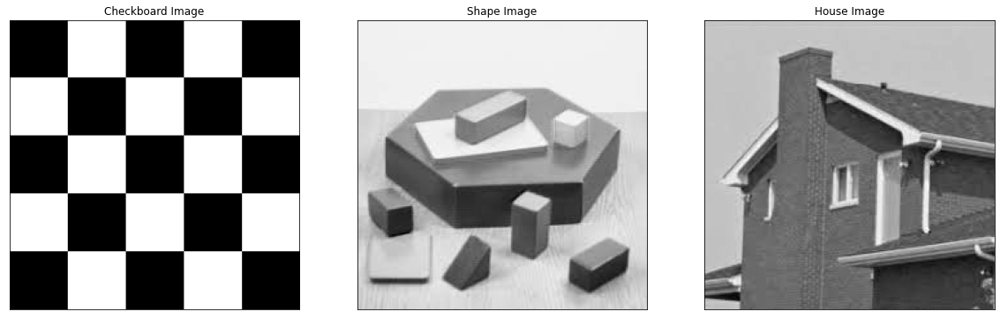

In [43]:
# Read the Checkboard Image, Shape Image and the House Image and convert them to grayscale
checkerboard_image = cv2.imread(path + 'q1.1.jpg', cv2.IMREAD_GRAYSCALE)
shape_image = cv2.imread(path + 'q1.2.png', cv2.IMREAD_GRAYSCALE)
house_image = cv2.imread(path + 'q1.3.png', cv2.IMREAD_GRAYSCALE)

# Plot the 3 images
plot.figure(figsize = (20, 20)) 

plot.subplot(131)
plot.imshow(checkerboard_image, cmap = 'gray')
plot.title("Checkboard Image")
plot.xticks([])
plot.yticks([])

plot.subplot(132)
plot.imshow(shape_image, cmap = 'gray')
plot.title("Shape Image")
plot.xticks([])
plot.yticks([])

plot.subplot(133)
plot.imshow(house_image, cmap = 'gray')
plot.title("House Image")
plot.xticks([])
plot.yticks([])

plot.show()

In [44]:
# Setup variables
size = 3
k = 0.05
color = (0, 0, 255) # Blue
thresholds = [1000000, 10000000, 100000000]
radius = 3
thickness = 3

# Functions that will be used multiple times in the whole question 1, a lot are based or from Tutorial 4

# Harris Corner Detection algorithm - Following the steps seen in Lecture 5 - slide 48
def harris_corner_detection(image):
  # Step 1 - Apply Gaussian Filtering on the image
  gaussian_filtered = cv2.GaussianBlur(image, (size, size), 0)

  # Step 2 - Compute image derivatives using the Sobel operator
  sobel_x = cv2.Sobel(gaussian_filtered, cv2.CV_64F, 1, 0, ksize = size)
  sobel_y = cv2.Sobel(gaussian_filtered, cv2.CV_64F, 0, 1, ksize = size)

  # Step 3 - Compute the square of the x- and y- derivatives
  derivative_x = sobel_x ** 2
  derivative_y = sobel_y ** 2
  derivative_xy = sobel_x * sobel_y

  # Step 4 - Apply Gaussian Filtering on the derivatives
  gaussian_derivative_x = cv2.GaussianBlur(derivative_x, (size, size), 0)
  gaussian_derivative_y = cv2.GaussianBlur(derivative_y, (size, size), 0)
  gaussian_derivative_xy = cv2.GaussianBlur(derivative_xy, (size, size), 0)

  # Step 5 - Compute the cornerness function response on the output of Step 4
  # det(H) - k * trace(H)^2) = g(Ix^2) * g(Iy^2) - g(IxIy)^2 - k * [g(Ixˆ2) + g(Iyˆ2)], where k = 0.05
  cornerness = (gaussian_derivative_x * gaussian_derivative_y) - (gaussian_derivative_xy) ** 2 - k * ((gaussian_derivative_x + gaussian_derivative_y) ** 2)

  # Step 6 - Perform non-maxima suppression on the output of Step 4 (the cornerness function)
  rows, columns = image.shape
  kernel_size = 3
  for i in range(rows - kernel_size + 1):
    for j in range(columns - kernel_size + 1):
      window = cornerness[i: i + kernel_size, j : j + kernel_size]
      maximum_value = np.amax(window)
      cornerness[i : i + kernel_size, j : j + kernel_size] = np.where(window >= maximum_value, maximum_value, 0)

  # Return the cornerness function
  return cornerness

# Step 7 - Threshold the output of the Non-maxima suppression
def threshold_nom_maxima(image, cornerness, threshold, radius, thickness):
  locations = np.where(cornerness >= threshold)
  for point in zip(* locations[: : -1]):
    cv2.circle(image, (point[0], point[1]), radius, color, thickness)

# The function main() runs the whole Harris Corner Detection and Threshold the output of the Non-maxima suppression
# With 3 different thresholds and print all the images
def main(image, image_name):
  # Call Harris Corner Detection on the image
  HCD_image = harris_corner_detection(image)

  # Detect Corners with a specific threshold
  for i in range(len(thresholds)):
    image_copy = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    threshold_nom_maxima(image_copy, HCD_image, thresholds[i], radius, thickness)

    # Plot resulting Image with a certain threshold
    plot.figure(figsize = (10, 10))
  
    plot.imshow(image_copy, cmap="gray")
    plot.title("{} Image - With Threshold = {}" .format(image_name, thresholds[i]))
    plot.xticks([])
    plot.yticks([])
    plot.show()

### Question 1.1

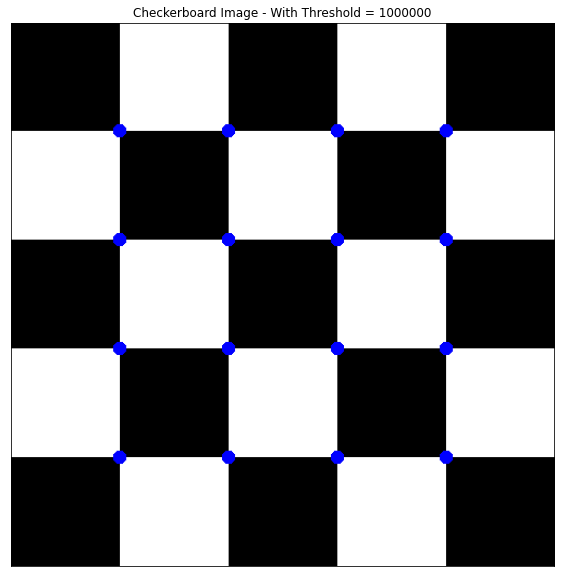

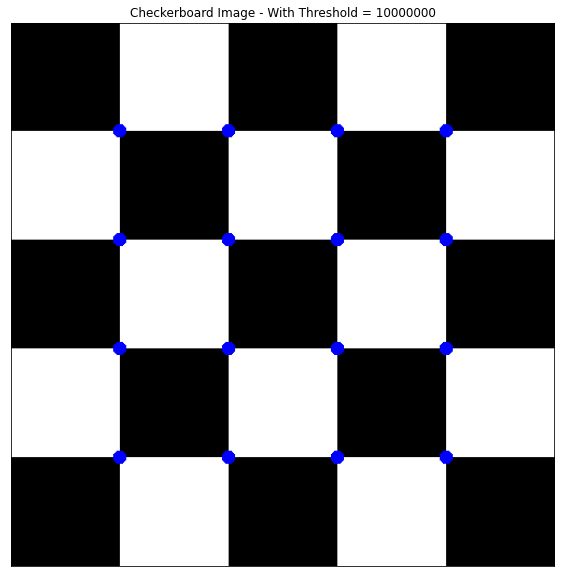

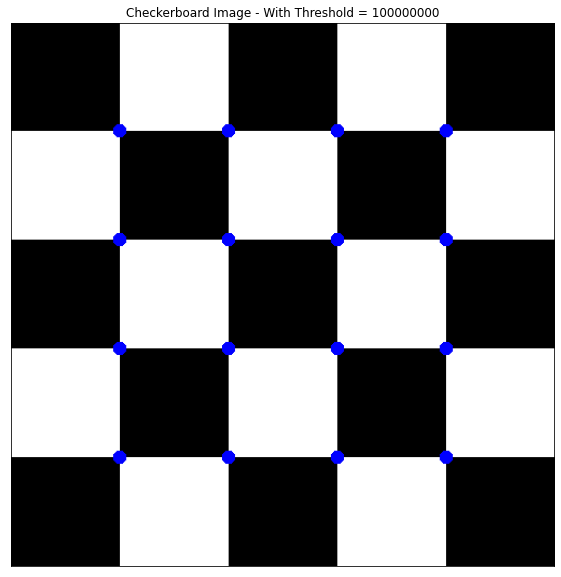

In [45]:
# Call main() function with Checkerboard Image
main(checkerboard_image, "Checkerboard")

We can observe above the 3 thresholded output images of the non-maxima suppression after running the Harris Corner Detection on the Checkerboard Image. The 3 chosen thresholds are 1 000 000, 10 000 000, 100 000 000. These values allowed to detect corners in the image at different thresholds.<br/>
In the case of the checkboard image, we can see that even if the threshold increases, we are able to observe the same corners (pointed in blue). This makes sense since a checkerboard is a pretty linear picture with black and white tiles, and thus no "obstacles" creating different shapes, shadows, perspective... Therefore detecting the corners is pretty easy no matter what the threshold value is.

### Question 1.2

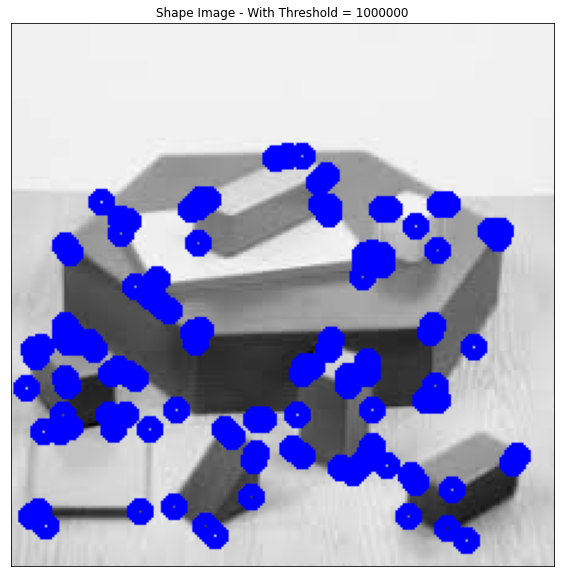

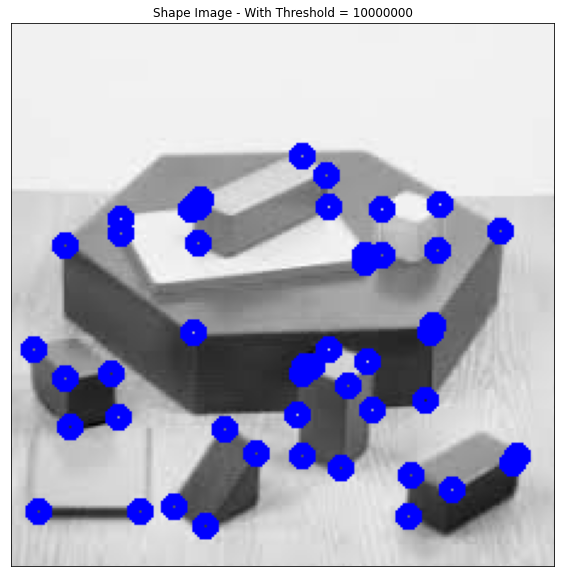

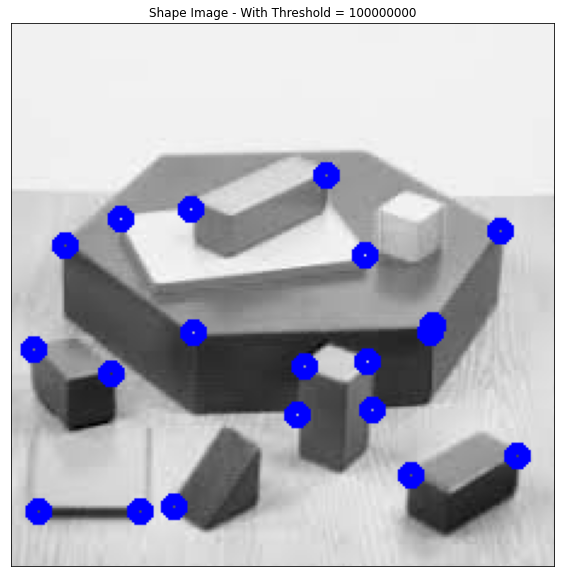

In [46]:
# Call main() function with Shape Image
main(shape_image, "Shape")

We can observe above the 3 thresholded output images of the non-maxima suppression after running the Harris Corner Detection on the Shape Image. The 3 chosen thresholds are 1 000 000, 10 000 000, 100 000 000. These values allowed to detect corners in the image at different thresholds.<br/>
In the case of the shape image, on the contrary to the checkerboard image, we can see differences when we increase the threshold value. Indeed, we can observe a decreasing number of corners (pointed in blue) when the threshold value increases. 
We can notice that in the picture with the smallest threshold value, a couple false positives are observed, even if they are situated near actual corners, and most of the corners are detected. On the opposite, in the image with the biggest threshold values, we can observe that some corners are not detected at all. These results can occur because of the lighing, shadows, blur and perspective.
Therefore, a good threshold to detect corners for the shape image would be closer to 10 000 000.

### Question 1.3

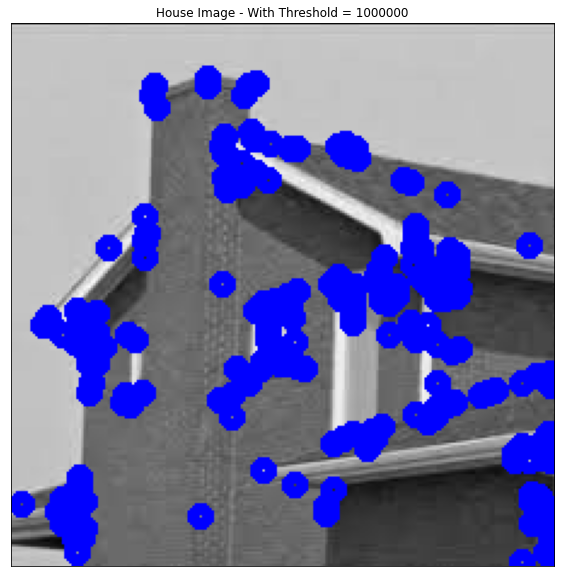

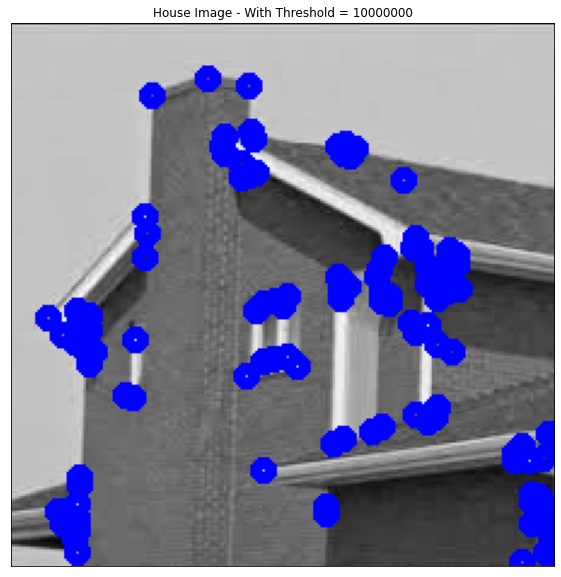

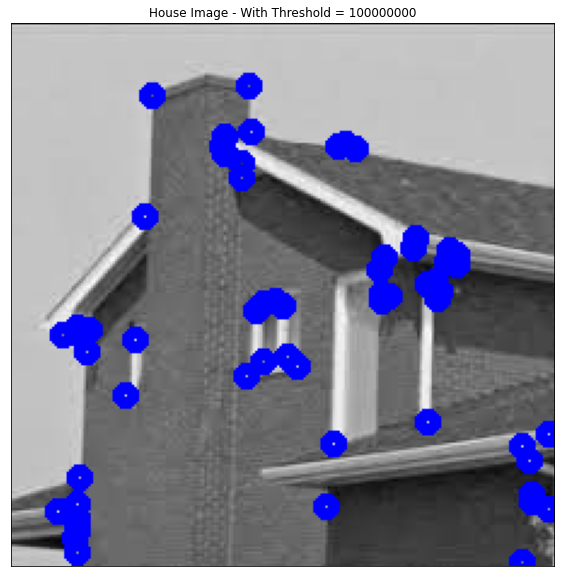

In [47]:
# Call main() function with House Image
main(house_image, "House")

We can observe above the 3 thresholded output images of the non-maxima suppression after running the Harris Corner Detection on the House Image. The 3 chosen thresholds are 1 000 000, 10 000 000, 100 000 000. These threshold values allowed to detect corners in the image at different thresholds.<br/>
In the case of the house image, we observe a similar effect to the one occuring for the shape image; differences occur when we increase the threshold value. Indeed, we can observe a decreasing number of corners (pointed in blue) when the threshold value increases. 
We can notice that in the picture with the smallest threshold value, a couple false positives are observed, even if they are situated near actual corners, and most of the corners are detected. The same occurs for the middle threshold value with less false positives. Same for the largest threshold value. These results can occur because of the lighing, shadows, blur and perspective.
Therefore, a good threshold to detect corners for the house image would be closer to 100 000 000.

---
## **2 - Invariance oof SIFT Features**


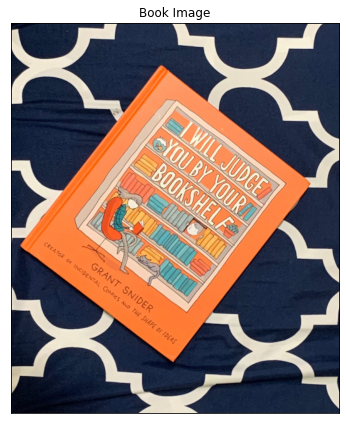

In [48]:
# Initial Setup
# Some functions / lines of code in this section come from Tutorial 4

# Read the book Image
book_image = cv2.imread(path + 'book.png')
# Convert image to RGB
book_image = cv2.cvtColor(book_image, cv2.COLOR_BGR2RGB)

# Plot the Book Image
plot.figure(figsize = (20, 20)) 

plot.subplot(131)
plot.imshow(book_image)
plot.title("Book Image")
plot.xticks([])
plot.yticks([])

plot.show()

### Question 2.1 - Invariance Under Scale

#### *Question 2.1.1*

In [49]:
# Compute SIFT keypoints for the reference image
sift = cv2.SIFT_create()
keypoints, descriptors = sift.detectAndCompute(book_image, None)

#### *Question 2.1.2*


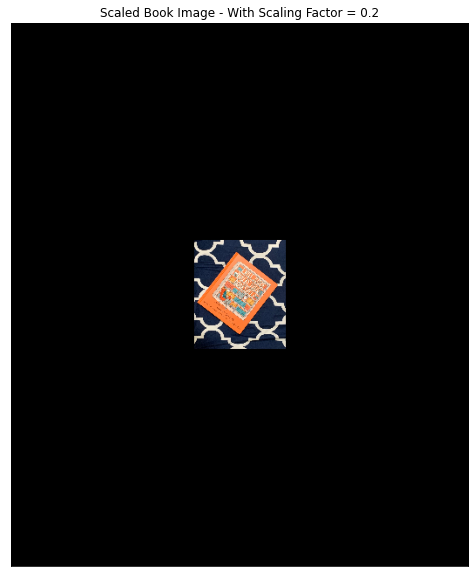

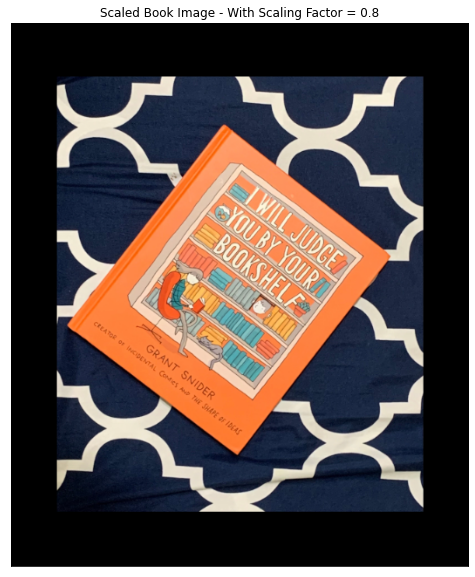

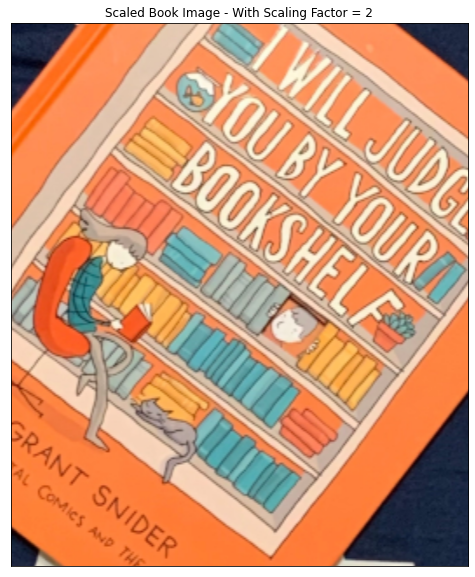

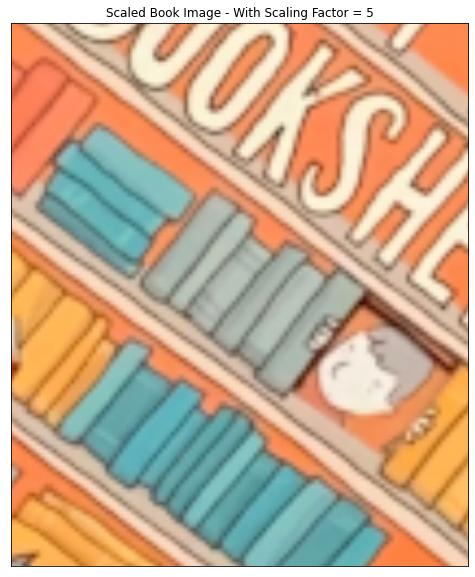

In [50]:
# Scale the reference image

# Setup Variables
height, width = book_image.shape[0 : 2]
scaling_factors = [0.2, 0.8, 2, 5]
scaled_images = []
angle = 0

# Scale the image with the according scaling factor
for i in range(len(scaling_factors)):
  matrix = cv2.getRotationMatrix2D((width / 2, height / 2), angle, scaling_factors[i])
  scaled_image = cv2.warpAffine(book_image, matrix, (width, height))
  scaled_images.append(scaled_image)

  # Plot the Book Scaled Image
  plot.figure(figsize = (10, 10)) 

  plot.imshow(scaled_images[i])
  plot.title("Scaled Book Image - With Scaling Factor = {}" .format(scaling_factors[i]))
  plot.xticks([])
  plot.yticks([])

  plot.show()

#### *Question 2.1.3*

In [51]:
# Compute SIFT keypoints for all transformed images
scaled_keypoints_array, scaled_descriptors_array = [], []

for i in range(len(scaling_factors)):
  scaled_keypoints, scaled_descriptors = sift.detectAndCompute(scaled_images[i], None)
  scaled_keypoints_array.append(scaled_keypoints)
  scaled_descriptors_array.append(scaled_descriptors)

#### *Question 2.1.4*

In [52]:
# Match all keypoints of the reference image to the transformed images using a brute-force method.
scaled_matches_array = []
brute_force = cv2.BFMatcher()

#### *Question 2.1.5*

In [53]:
# Sort matching keypoints according to the matching distance.
for i in range(len(scaling_factors)):
  scaled_matches = sorted(brute_force.match(descriptors, scaled_descriptors_array[i]), key = lambda x : x.distance)
  scaled_matches_array.append(scaled_matches)

#### *Question 2.1.6*

<function matplotlib.pyplot.show>

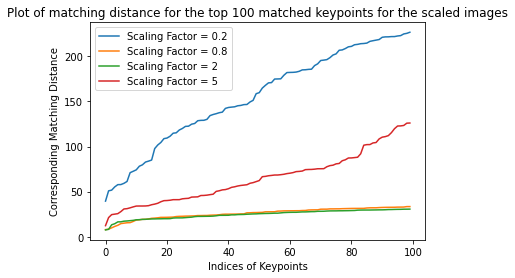

In [54]:
# Plot the matching distance for the top 100 matched keypoins
transformed_images, top_matched_keypoints = 4, 100
scales = []

for i in range(transformed_images):
  scales.append([])
  for j in range(top_matched_keypoints):
    scales[i].append(scaled_matches_array[i][j].distance)

# Plot Graph
plot.plot(scales[0], label="Scaling Factor = {}" .format(scaling_factors[0]))
plot.plot(scales[1], label="Scaling Factor = {}" .format(scaling_factors[1]))
plot.plot(scales[2], label="Scaling Factor = {}" .format(scaling_factors[2]))
plot.plot(scales[3], label="Scaling Factor = {}" .format(scaling_factors[3]))
plot.title("Plot of matching distance for the top 100 matched keypoints for the scaled images")
plot.xlabel("Indices of Keypoints")
plot.ylabel("Corresponding Matching Distance")
plot.legend()
plot.show


#### *Question 2.1.7*

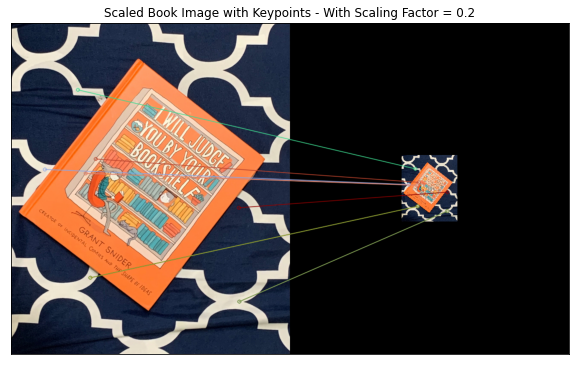

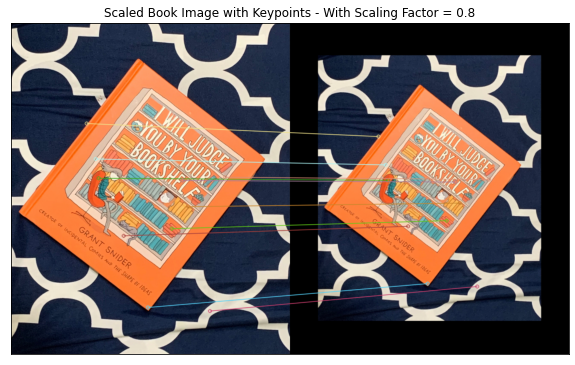

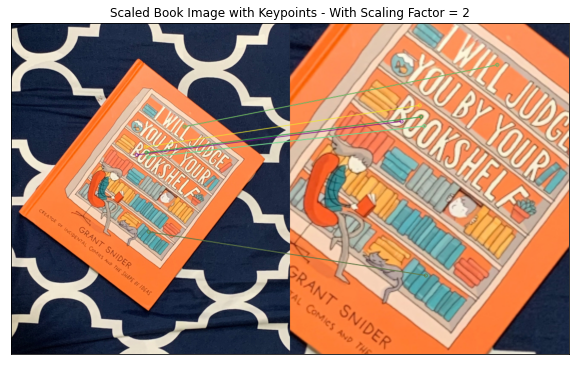

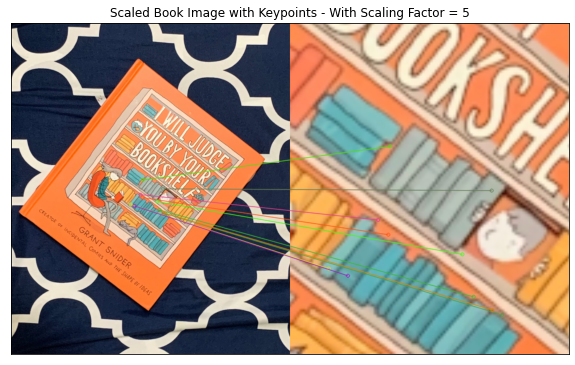

In [55]:
# Plot the top ten matched keypoints for each pair of the reference image and a transformed image.

# Draw matches
for i in range(len(scaling_factors)):
  scaled_display = cv2.drawMatches(book_image, keypoints, scaled_images[i], scaled_keypoints_array[i], scaled_matches_array[i][ : 10], None, flags = 2)

  # Plot the Book Scaled Images with their Keypoints
  plot.figure(figsize = (10, 10)) 

  plot.imshow(scaled_display)
  plot.title("Scaled Book Image with Keypoints - With Scaling Factor = {}" .format(scaling_factors[i]))
  plot.xticks([])
  plot.yticks([])

  plot.show()

#### *Question 2.1.8*

In the graph displayed in 2.1.6, we can observe 2 important things:
- the matching distance corresponding to the indices of keypoints always increases when the indices of keypoints increase, and the functions look like a linear functions, which makes sense since we sorted the array right before making the graph
- when the indices of keypoints increase the corresponding matching distance increases but, when the scaling factor increases, the function generally increases less than when the scaling factor was lower until a certain scaling factor value, in which the function gets bad again

The possible reasons to this phenomena could be that when an image is extremely scaled, more and more information are lost from the image. That is why we can see better function when increasing the scaling factor, in which the matching distance gets smaller, until a certain scaling factor value in which the function will get bad again since we do not have enough information to find matches.



### Question 2.2 - Invariance Under Rotation


#### *Question 2.2.1*

In [56]:
# Compute SIFT keypoints for the reference image
keypoints, descriptors = sift.detectAndCompute(book_image, None)

#### *Question 2.2.2*

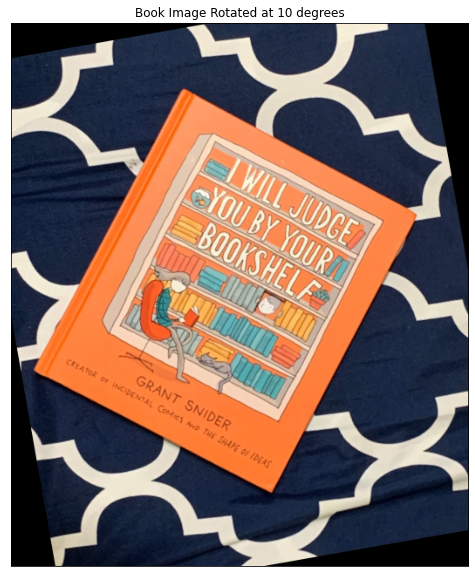

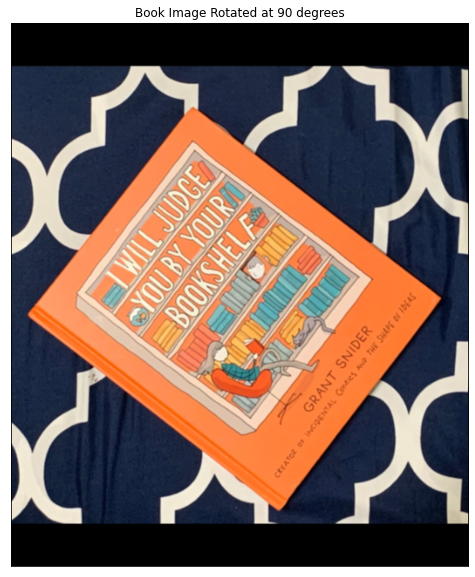

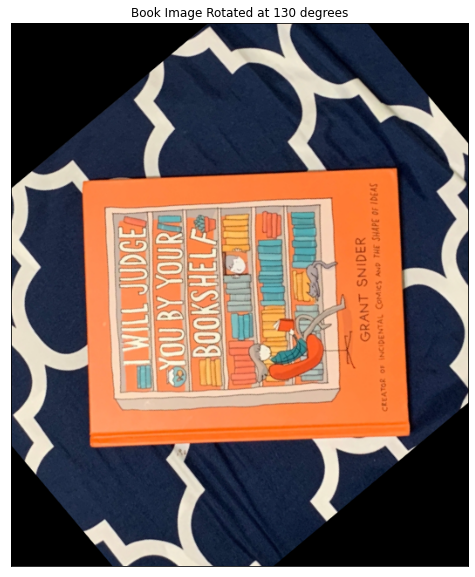

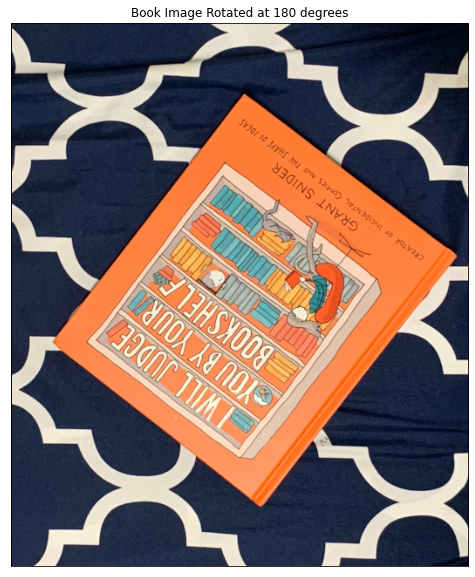

In [57]:
# Rotate the reference image

# Setup variables
height, width = book_image.shape[0 : 2]
angles = [10, 90, 130, 180]
rotated_images = []
scaling_factor = 1

for i in range(len(angles)):
  matrix = cv2.getRotationMatrix2D((width / 2, height / 2), angles[i], scaling_factor)
  rotated_image = cv2.warpAffine(book_image, matrix, (width, height))
  rotated_images.append(rotated_image)

  # Plot the Book Rotated Images
  plot.figure(figsize = (10, 10)) 

  plot.imshow(rotated_images[i])
  plot.title("Book Image Rotated at {} degrees" .format(angles[i]))
  plot.xticks([])
  plot.yticks([])

  plot.show()

#### *Question 2.2.3*

In [58]:
# Compute SIFT keypoints for all (total 4) transformed images.
rotated_keypoints_array, rotated_descriptors_array = [], []

for i in range(len(angles)):
  rotated_keypoints, rotated_descriptors = sift.detectAndCompute(rotated_images[i], None)
  rotated_keypoints_array.append(rotated_keypoints)
  rotated_descriptors_array.append(rotated_descriptors)

#### *Questions 2.2.4*

In [59]:
# Match all keypoints of the reference image to the transformed images using a brute-force method
rotated_matches_array = []
brute_force = cv2.BFMatcher()

#### *Questions 2.2.5*

In [60]:
# Sort the matching keypoints according the matching distance
for i in range(len(angles)):
  rotated_matches = sorted(brute_force.match(descriptors, rotated_descriptors_array[i]), key = lambda x:x.distance)
  rotated_matches_array.append(rotated_matches)

#### *Question 2.2.6*

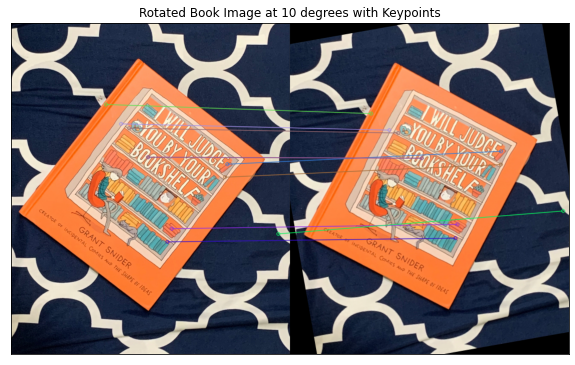

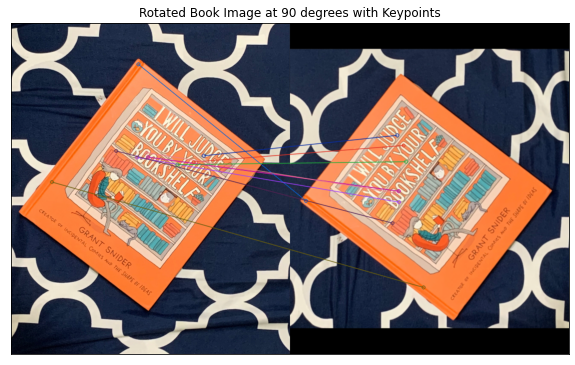

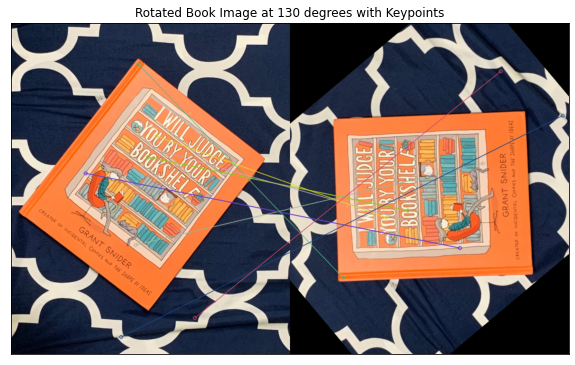

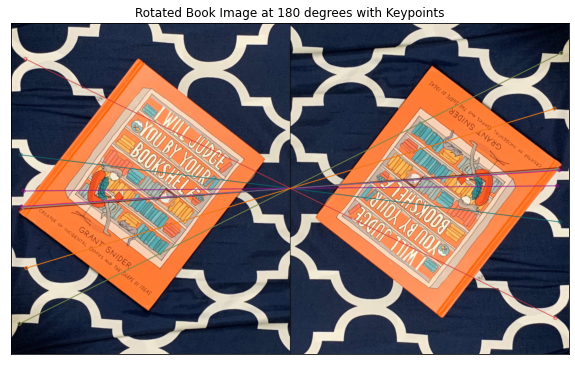

In [61]:
# Plot the top ten matched keypoints for each pair of the reference image and a transformed image

# Draw matches
for i in range(len(angles)):
  rotated_display = cv2.drawMatches(book_image, keypoints, rotated_images[i], rotated_keypoints_array[i], rotated_matches_array[i][ : 10], None, flags = 2)
  
  # Plot the Book Scaled Images with their Keypoints
  plot.figure(figsize = (10, 10))
  
  plot.imshow(rotated_display)
  plot.title("Rotated Book Image at {} degrees with Keypoints" .format(angles[i]))
  plot.xticks([])
  plot.yticks([])
  plot.show()

#### *Question 2.2.7*

<function matplotlib.pyplot.show>

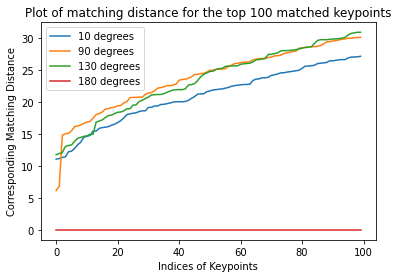

In [62]:
# Plot the matching distance for the top 100 matched keypoints
transformed_images, top_matched_keypoints = 4, 100
rotated_images = []

for i in range(transformed_images):
  rotated_images.append([])
  for j in range(top_matched_keypoints):
    rotated_images[i].append(rotated_matches_array[i][j].distance)

# Plot Graph
plot.plot(rotated_images[0], label="{} degrees" .format(angles[0]))
plot.plot(rotated_images[1], label="{} degrees" .format(angles[1]))
plot.plot(rotated_images[2], label="{} degrees" .format(angles[2]))
plot.plot(rotated_images[3], label="{} degrees" .format(angles[3]))
plot.title("Plot of matching distance for the top 100 matched keypoints")
plot.xlabel("Indices of Keypoints")
plot.ylabel("Corresponding Matching Distance")
plot.legend()
plot.show

#### *Question 2.2.8*

In the graph displayed in 2.2.7, we can observe 2 important things:
- the matching distance corresponding to the indices of keypoints always increases when the indices of keypoints increase, and the functions look like a linear functions, which makes sense since we sorted the array right before making the graph
- the functions are extremely similar for any degree except 180 degrees

The possible reasons to this phenomena could be that when we rotate an image to a non-180-degree, the pixel values are changed and the value are not mirroring, resulting in features that are not identical and which allow to capture matches. In the case of a 180-degree rotation, the transformations will give the same pixel values since the roatation can be seen as a flip along the vertical axis. This results in identical and matching features.

---
## **3 - Image Stitching**


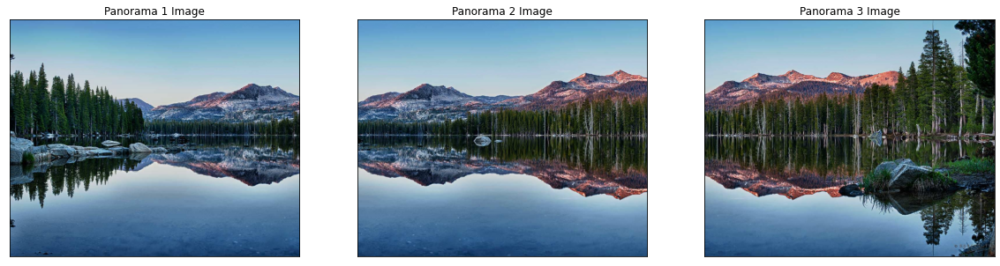

In [63]:
# Initial Setup

# Read the Panorama 1, Panorama 2, Panorama 3 Images
panorama1_image = cv2.imread(path + 'panorama1.png')
panorama2_image = cv2.imread(path + 'panorama2.png')
panorama3_image = cv2.imread(path + 'panorama3.png')

# Convert images to RGB
panorama1_image = cv2.cvtColor(panorama1_image, cv2.COLOR_BGR2RGB)
panorama2_image = cv2.cvtColor(panorama2_image, cv2.COLOR_BGR2RGB)
panorama3_image = cv2.cvtColor(panorama3_image, cv2.COLOR_BGR2RGB)

# Plot the 3 Paranoma Images
plot.figure(figsize = (20, 20)) 

plot.subplot(131)
plot.imshow(panorama1_image)
plot.title("Panorama 1 Image")
plot.xticks([])
plot.yticks([])

plot.subplot(132)
plot.imshow(panorama2_image)
plot.title("Panorama 2 Image")
plot.xticks([])
plot.yticks([])

plot.subplot(133)
plot.imshow(panorama3_image)
plot.title("Panorama 3 Image")
plot.xticks([])
plot.yticks([])

plot.show()

In [64]:
# Functions that will be used multiple times in the whole question 3, a lot are based or from Tutorial 4

# Function for computing the SIFT keypoints and corresponding descriptors
def compute_keypoints_and_descriptors(image):
  # Copy image
  image_copy = image.copy()

  # Create SIFT object (same as in question 2)
  sift = cv2.SIFT_create()

  # Detect SIFT features with no mask and compute SIFT descriptors
  keypoints, descriptors = sift.detectAndCompute(image_copy, None)

  # Draw the keypoints
  cv2.drawKeypoints(image, keypoints, image_copy, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
  
  return keypoints, descriptors, image_copy


# Find the matching keypoints between 2 images and display the best pairs
def matching_keypoints(image1, image2, keypoints1, keypoints2, descriptors1, descriptors2, best_pairs):
  # Create Brute Force Matcher object 
  brute_force = cv2.BFMatcher()

  # Match descriptors from Image 1 and Image 2
  matches = brute_force.match(descriptors1, descriptors2)

  # Sort them in the order of their matching distance
  matches = sorted(matches, key = lambda x:x.distance)

  # Draw top best_pairs matching keypoints 
  output_image = cv2.drawMatches(image1, keypoints1, image2, keypoints2, matches[0 : best_pairs], None, flags = 2)

  return matches, output_image


# Compute the homography using the RANSAC method
# The variable case_number can change according to what image should be the left/right one, if we have to transform image 1 or image 2...
def homography(image1, image2, keypoints1, keypoints2, matches, case_number):
  good_matches = []
  
  for match in matches:
    good_matches.append((match.trainIdx, match.queryIdx))

  mpr = np.float32([keypoints1[i].pt for (_, i) in good_matches])
  mpl = np.float32([keypoints2[i].pt for (i, _) in good_matches])

  if (case_number == 0):
    for i in range(len(mpl)):
      mpl[i][0] += image2.shape[1]

  # Find homorgraphy using RANSAC on Image 1 and padded Image 2 and Warp Image 1
  if (case_number == 0):
    H, __ = cv2.findHomography(mpr, mpl, cv2.RANSAC, 4)
    warp_image = cv2.warpPerspective(image1, H, (image1.shape[1] + image2.shape[1], image1.shape[0]))
    # Pad Image 2, so the Image 1 can be transformed onto it
    image2_base = np.uint8(np.zeros(warp_image.shape))
    image2_base[:, image1.shape[1] : , :] = image2
  elif (case_number == 1):
    H, __ = cv2.findHomography(mpl, mpr, cv2.RANSAC, 4)
    warp_image = cv2.warpPerspective(image1, H, (image1.shape[1] + image2.shape[1], image1.shape[0]))
    # Pad Image 1, so the Image 2 can be transformed onto it
    image2_base = np.uint8(np.zeros(warp_image.shape))
    image2_base[:, : image2.shape[1], :] = image2

  return warp_image, image2_base


# The 2 following functions allow to do stitching 2 images together using linear image blending 
def feathering(width, edge, size):
  weighted_array = np.zeros(width).astype(np.float)

  # Weigthed step has to incrementally increase from 0 
  weighted_step = 1 / (size - 1)
  index = round(edge - (size / 2))
  for i in range(size):
    weighted_array[index] = weighted_step * i
    index += 1
  
  weighted_array[index:] = 1
  
  return weighted_array


def blending(image1, image2_base, image12, case_number):
  value = 1
  if (case_number == 1):
    value = -1

  # Alpha for Linear Blending
  alpha = feathering(image12.shape[1], image1.shape[1] + value * 50, 50)
  alpha = alpha.reshape(1, -1, 1)

  # Weight pixels on the right hand side edge of Image 1 and the left hand side edge of Image 2, and Linear blend both images
  if(case_number == 0):
    image12 = np.uint8(image12 * (1 - alpha))
    image2_base = np.uint8(image2_base * alpha)
    blended_image = image12 + image2_base
  elif (case_number == 1):
    image2_base = np.uint8(image2_base * (1 - alpha))
    image12 = np.uint8(image12 * alpha)
    blended_image = image2_base + image12

  return image12, image2_base, blended_image 

### Question 3.1

Computed SIFT Keypoints of the Panorama 1 Image


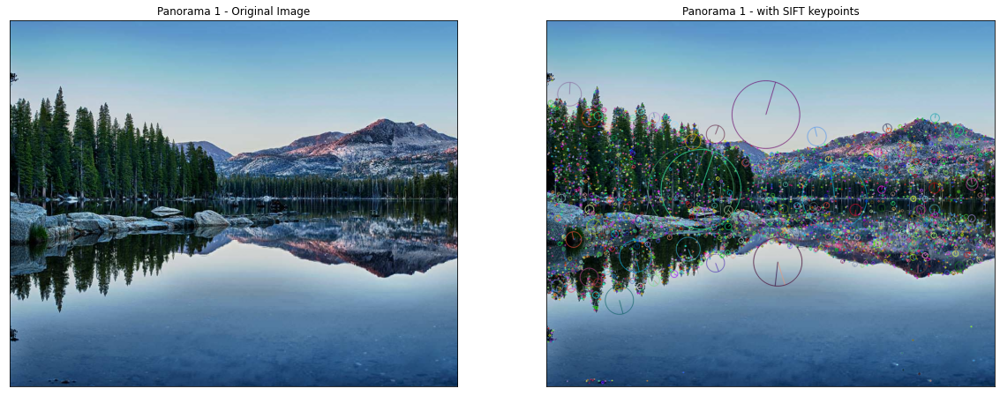

Corresponding SIFT Descriptors of the Panorama 1 Image


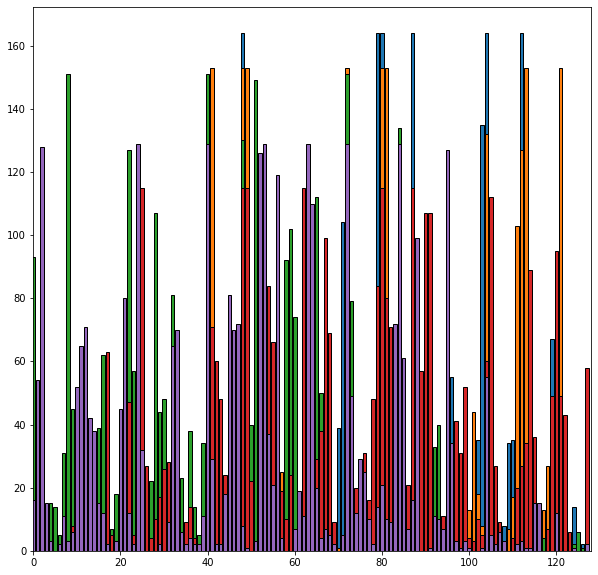



Computed SIFT Keypoints of the Panorama 2 Image


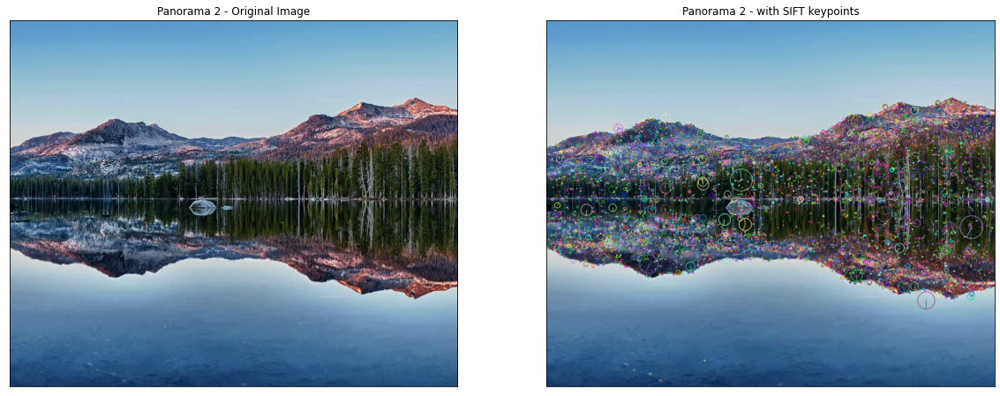

Corresponding SIFT Descriptors of the Panorama 2 Image


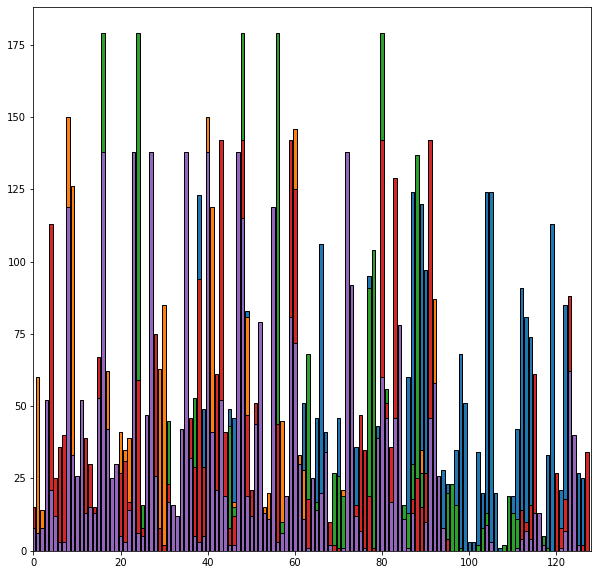

In [65]:
# Setup Variables
panorama_images = [panorama1_image, panorama2_image]
keypoints_panoramas, descriptors_panoramas = [], []

# Call function compute_keypoints_and_descriptors for Panorama 1 and Panorama 2
for i in range(len(panorama_images)):
  keypoints_panorama, descriptors_panorama, panorama_image_copy = compute_keypoints_and_descriptors(panorama_images[i])
  keypoints_panoramas.append(keypoints_panorama)
  descriptors_panoramas.append(descriptors_panorama)

  # Plot Panorama 1 and Panorama 2 Images with their Keypoints
  print("Computed SIFT Keypoints of the Panorama {} Image" .format(i + 1))
  plot.figure(figsize = (20, 20))

  plot.subplot(121)
  plot.imshow(panorama_images[i])
  plot.xticks([])
  plot.yticks([])
  plot.title("Panorama {} - Original Image" .format(i + 1))

  plot.subplot(122)
  plot.imshow(panorama_image_copy)
  plot.xticks([])
  plot.yticks([])
  plot.title("Panorama {} - with SIFT keypoints" .format(i + 1))

  plot.show()

  print("Corresponding SIFT Descriptors of the Panorama {} Image" .format(i + 1))
  # Plot Descriptors
  plot.figure(figsize = (10, 10))
  for j in range(5):
    plot.bar(np.arange(0, 128), descriptors_panorama[j], edgecolor='k')
    plot.xlim([0, 128])
  plot.show()

  print("\n")

### Question 3.2

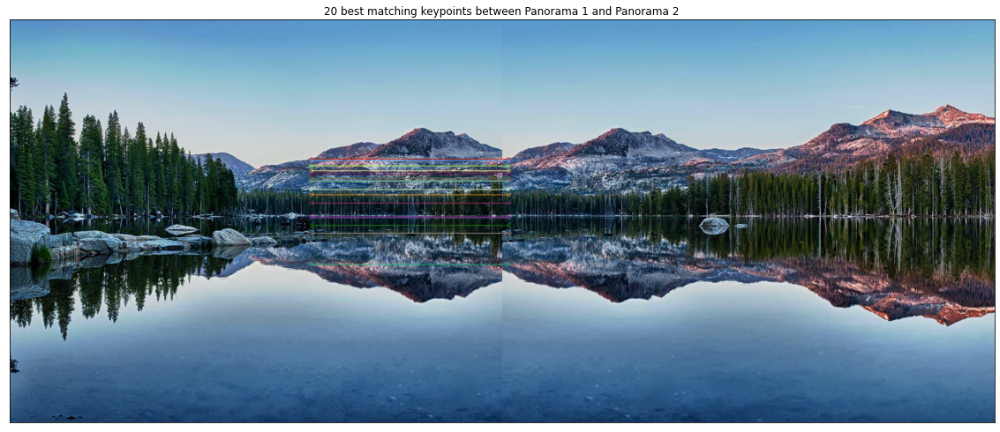

In [66]:
# Call the matching_keypoints() function, 20 best pairs
best_pairs = 20
matches, panorama12_matches = matching_keypoints(panorama_images[0], panorama_images[1], keypoints_panoramas[0], keypoints_panoramas[1], descriptors_panoramas[0], descriptors_panoramas[1], best_pairs)

plot.figure(figsize = (20, 20))

plot.imshow(panorama12_matches)
plot.xticks([])
plot.yticks([])
plot.title("20 best matching keypoints between Panorama 1 and Panorama 2")
plot.show()

### Question 3.3

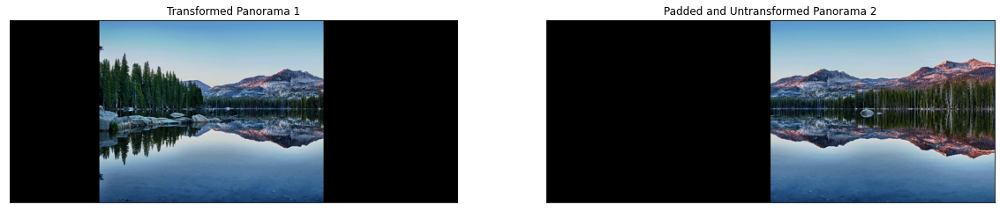

In [67]:
panorama12_image, panorama2_image_base = homography(panorama_images[0], panorama_images[1], keypoints_panoramas[0], keypoints_panoramas[1], matches, 0)

plot.figure(figsize = (20, 20))

plot.subplot(121)
plot.imshow(panorama12_image)
plot.title("Transformed Panorama 1")
plot.xticks([])
plot.yticks([])

plot.subplot(122)
plot.imshow(panorama2_image_base)
plot.title("Padded and Untransformed Panorama 2")
plot.xticks([])
plot.yticks([])

plot.show()

### Question 3.4

Performing Blending and Image Stitching to form the panoramic image: Panorama 12



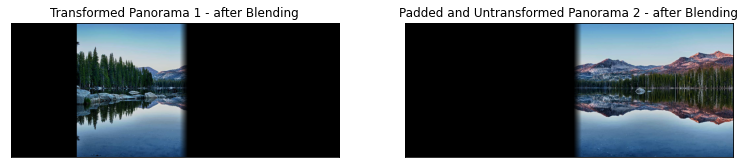

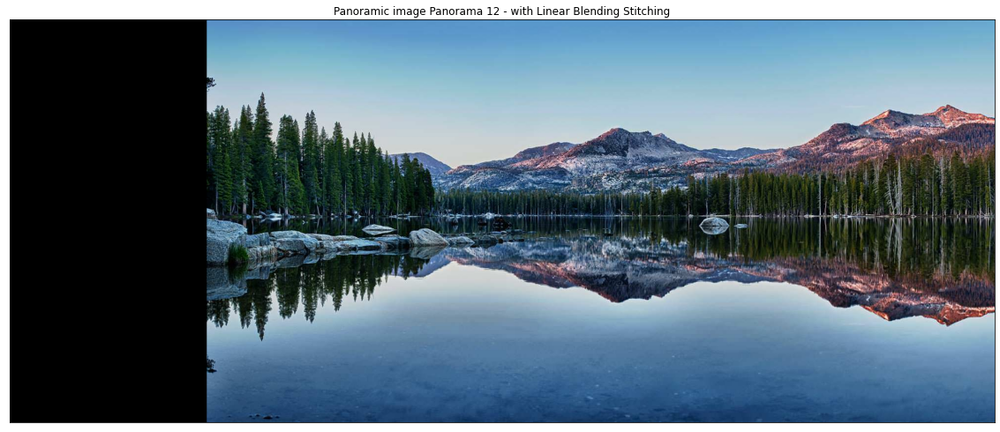

In [68]:
# Call blending() function
panorama12_image, panorama2_image_base, blended_image = blending(panorama1_image, panorama2_image_base, panorama12_image, 0)

# Plot Images
print("Performing Blending and Image Stitching to form the panoramic image: Panorama 12\n")
plot.figure(figsize = (20, 20))

plot.subplot(131)
plot.imshow(panorama12_image)
plot.title("Transformed Panorama 1 - after Blending")
plot.xticks([])
plot.yticks([])

plot.subplot(132)
plot.imshow(panorama2_image_base)
plot.title("Padded and Untransformed Panorama 2 - after Blending")
plot.xticks([])
plot.yticks([])

plot.show()

plot.figure(figsize = (20, 20))
plot.imshow(blended_image)
plot.title("Panoramic image Panorama 12 - with Linear Blending Stitching")
plot.xticks([])
plot.yticks([])

plot.show()

### Question 3.5


Computed SIFT Keypoints of the Panorama 12 Image


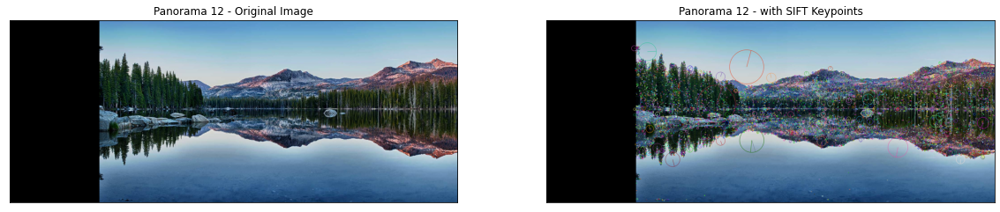

Corresponding SIFT Descriptors of the Panorama 1 Image


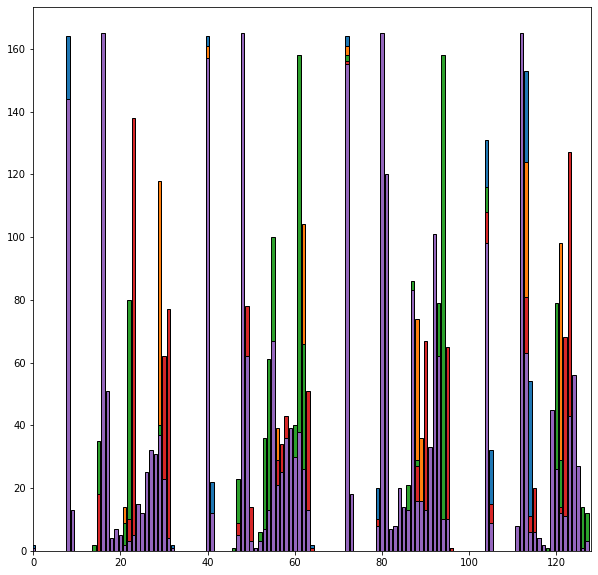




Computed SIFT Keypoints of the Panorama 3 Image


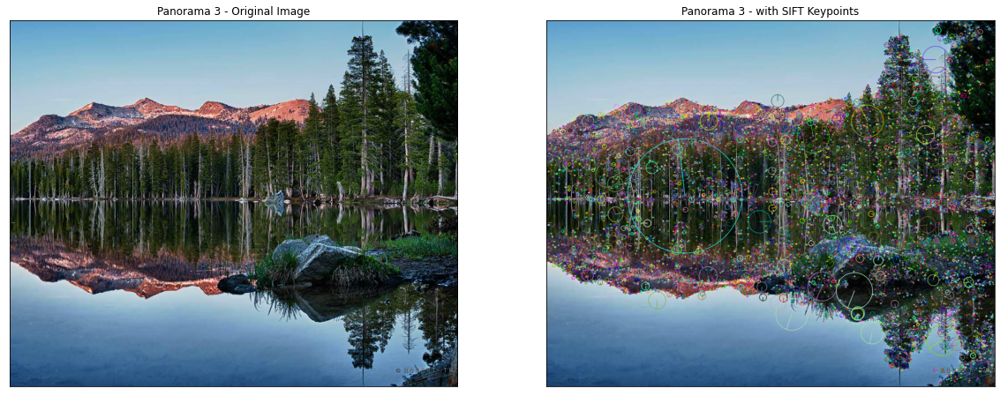

Corresponding SIFT Descriptors of the Panorama 2 Image


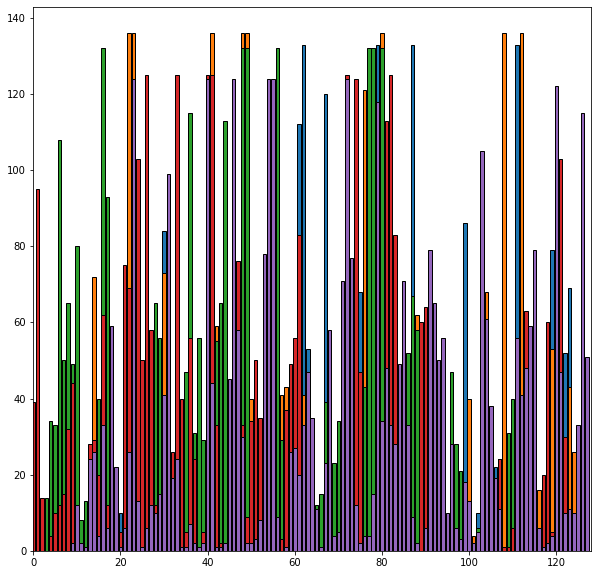

In [69]:
# Call the compute_keypoints_and_descriptors() function from Question 3.1 with the blended Panorama 12 and Panorama 3
# Setup variables
panorama12_image = blended_image
panorama_images = [panorama12_image, panorama3_image]
keypoints_panoramas, descriptors_panoramas = [], []
image_number = [12, 3]

# Call function above for Panorama 1 and Panorama 2
for i in range(len(panorama_images)):
  keypoints_panorama, descriptors_panorama, panorama_image_copy = compute_keypoints_and_descriptors(panorama_images[i])
  keypoints_panoramas.append(keypoints_panorama)
  descriptors_panoramas.append(descriptors_panorama)

  # Plot Images
  print("\nComputed SIFT Keypoints of the Panorama {} Image" .format(image_number[i]))
  plot.figure(figsize = (20, 20))

  plot.subplot(121)
  plot.imshow(panorama_images[i])
  plot.xticks([])
  plot.yticks([])
  plot.title("Panorama {} - Original Image" .format(image_number[i]))

  plot.subplot(122)
  plot.imshow(panorama_image_copy)
  plot.xticks([])
  plot.yticks([])
  plot.title("Panorama {} - with SIFT Keypoints" .format(image_number[i]))
  
  plot.show()

  print("Corresponding SIFT Descriptors of the Panorama {} Image" .format(i + 1))
  # Plot Descriptors
  plot.figure(figsize = (10, 10))
  for j in range(5):
    plot.bar(np.arange(0, 128), descriptors_panorama[j], edgecolor='k')
    plot.xlim([0, 128])
  plot.show()

  print("\n")

### Question 3.6

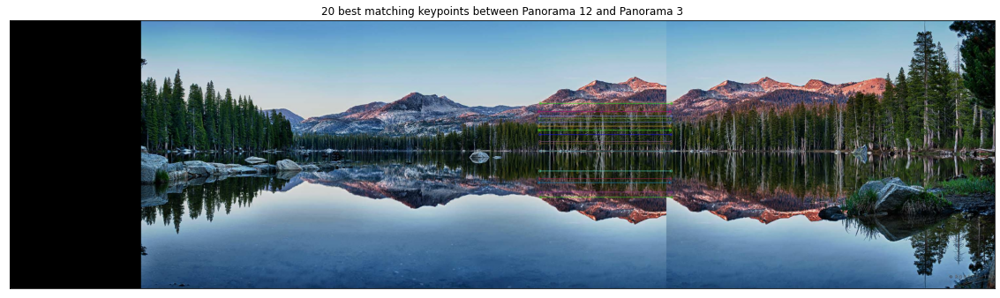

In [70]:
# Call the matching_keypoints() function, 20 best pairs
best_pairs = 20
matches, panorama123_matches = matching_keypoints(panorama_images[0], panorama_images[1], keypoints_panoramas[0], keypoints_panoramas[1], descriptors_panoramas[0], descriptors_panoramas[1], best_pairs)

# Plot Image
plot.figure(figsize = (20,20))

plot.imshow(panorama123_matches)
plot.xticks([])
plot.yticks([])
plot.title("20 best matching keypoints between Panorama 12 and Panorama 3")
plot.show()

### Question 3.7

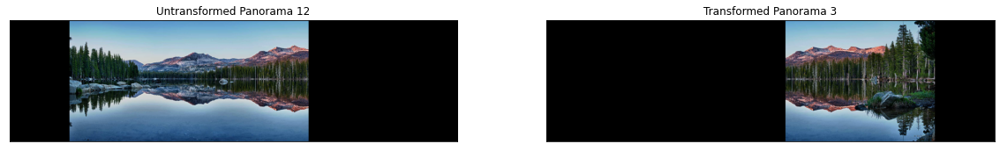

In [71]:
# Call the homography() function
panorama123_image, panorama12_image_base = homography(panorama_images[1], panorama_images[0], keypoints_panoramas[0], keypoints_panoramas[1], matches, 1)

# Plot Images
plot.figure(figsize = (20, 20))

plot.subplot(121)
plot.imshow(panorama12_image_base)
plot.title("Untransformed Panorama 12")

plot.xticks([])
plot.yticks([])

plot.subplot(122)
plot.imshow(panorama123_image)
plot.title("Transformed Panorama 3")
plot.xticks([])
plot.yticks([])

plot.show()

### Question 3.8

Performing Blending and Image Stitching to form the panoramic image: Panorama 123



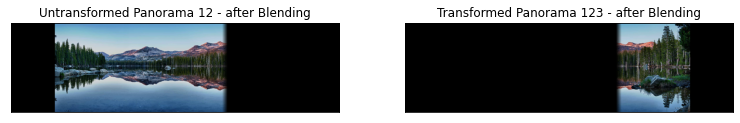

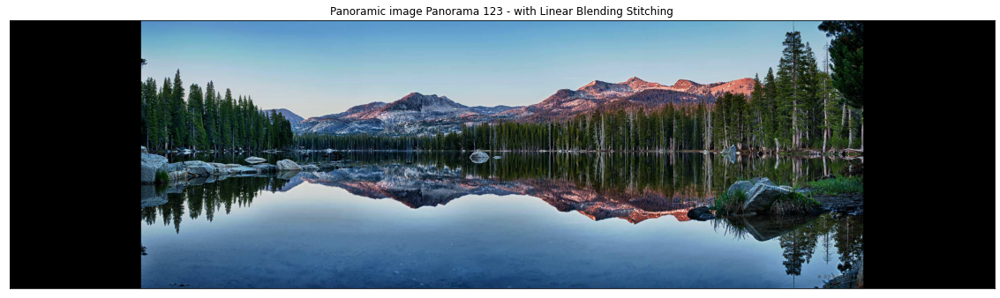

In [72]:
# Call blending() function
panorama123_image, panorama12_image_base, blended_image = blending(panorama12_image, panorama12_image_base, panorama123_image, 1)

# Plot Images
print("Performing Blending and Image Stitching to form the panoramic image: Panorama 123\n")
plot.figure(figsize = (20, 20))

plot.subplot(131)
plot.imshow(panorama12_image_base)
plot.title("Untransformed Panorama 12 - after Blending")
plot.xticks([])
plot.yticks([])

plot.subplot(132)
plot.imshow(panorama123_image)
plot.title("Transformed Panorama 123 - after Blending")
plot.xticks([])
plot.yticks([])
plot.show()

plot.figure(figsize = (20, 20))
plot.imshow(blended_image)
plot.title("Panoramic image Panorama 123 - with Linear Blending Stitching")
plot.xticks([])
plot.yticks([])

plot.show()

### Question 3.9

Pyramid blending consists of shrinking a smoothed image by a factor of 2 (1/2), then smooth the resulting image and shrinking it by a factor of 2 again (1/4) and so on, leading to images with lower resolution. 
Pyramid blending is not limited to blending down the middle of an image. It can help blend contours, and merge images in all sort of ways.
Thus, pyramid blending would be prefered when working with extremelly detailed images, making their blending and stitching as smooth as possible.

---
## **4 - Image Matching**


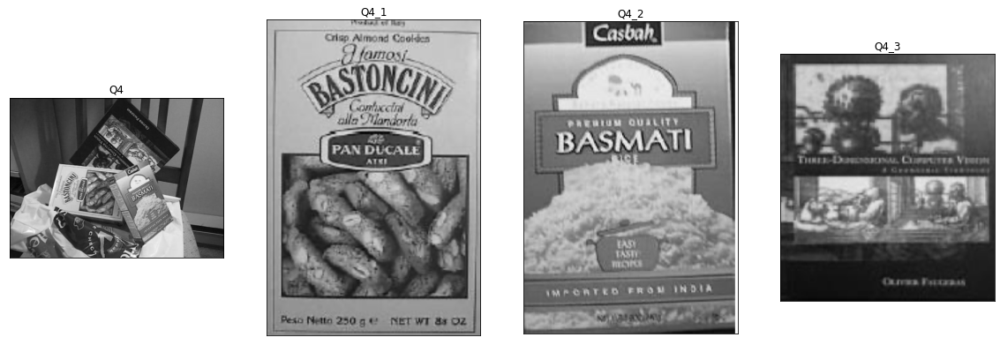

In [73]:
# Read the question 4 images and convert them to grayscale
q4_image = cv2.imread(path + 'q4.png', cv2.COLOR_BGR2RGB)
q4_1_image = cv2.imread(path + 'q4_1.png', cv2.COLOR_BGR2RGB)
q4_2_image = cv2.imread(path + 'q4_2.png', cv2.COLOR_BGR2RGB)
q4_3_image = cv2.imread(path + 'q4_3.png', cv2.COLOR_BGR2RGB)

# Plot the 4 Images
plot.figure(figsize = (20, 20))

plot.subplot(141)
plot.imshow(q4_image, cmap = 'gray')
plot.title("Q4")
plot.xticks([])
plot.yticks([])

plot.subplot(142)
plot.imshow(q4_1_image, cmap = 'gray')
plot.title("Q4_1")
plot.xticks([])
plot.yticks([])

plot.subplot(143)
plot.imshow(q4_2_image, cmap = 'gray')
plot.title("Q4_2")
plot.xticks([])
plot.yticks([])

plot.subplot(144)
plot.imshow(q4_3_image, cmap = 'gray')
plot.title("Q4_3")
plot.xticks([])
plot.yticks([])

plot.show()

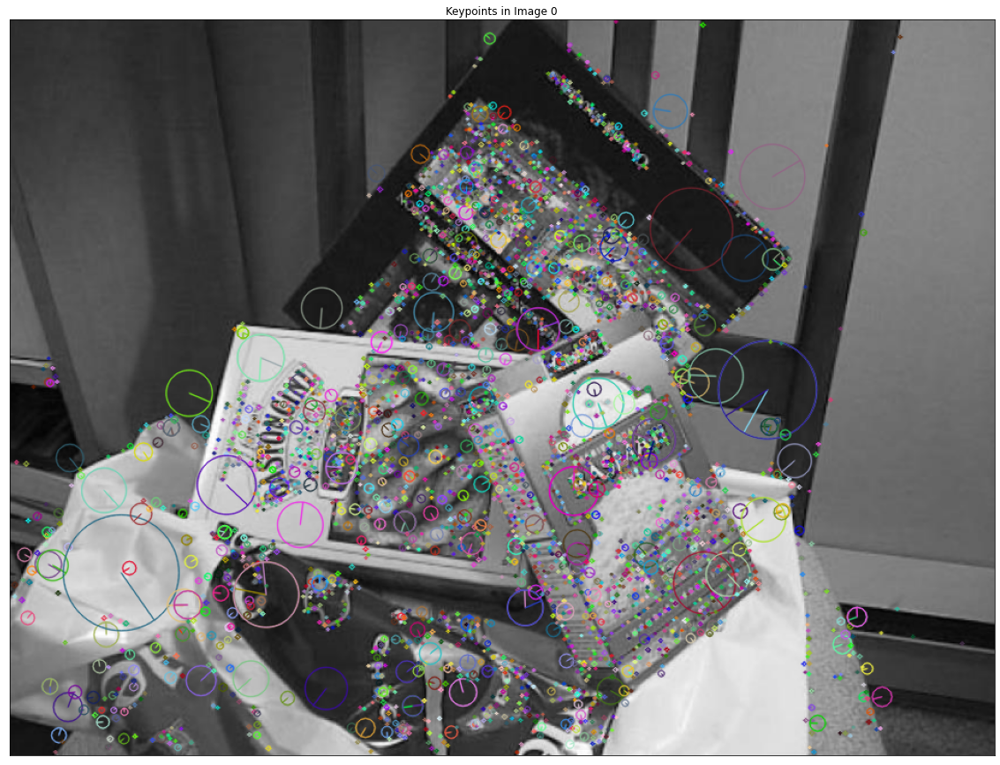

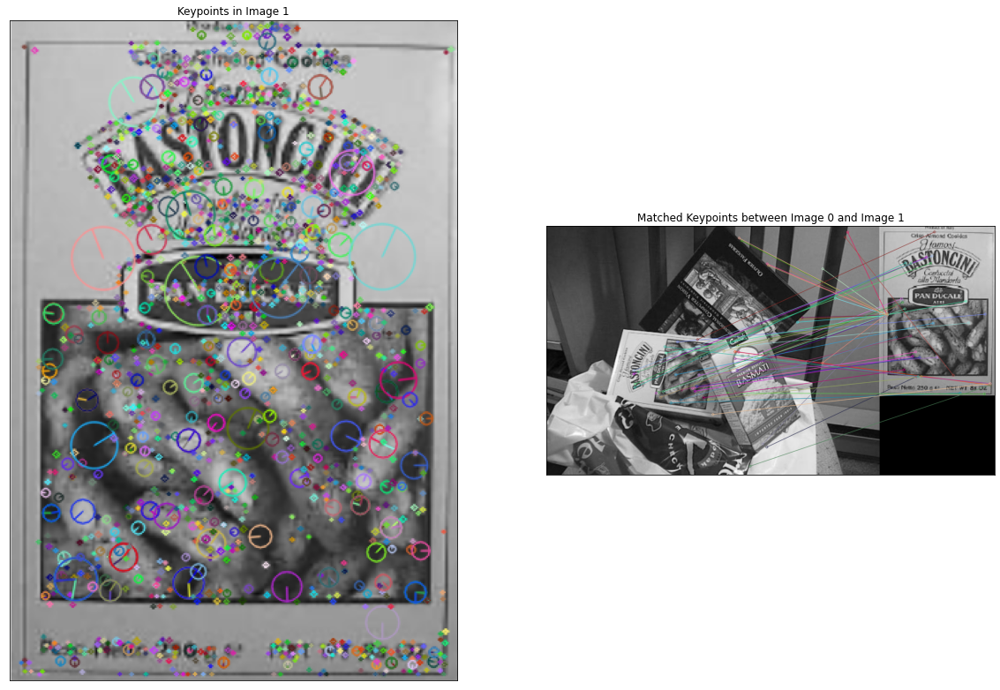

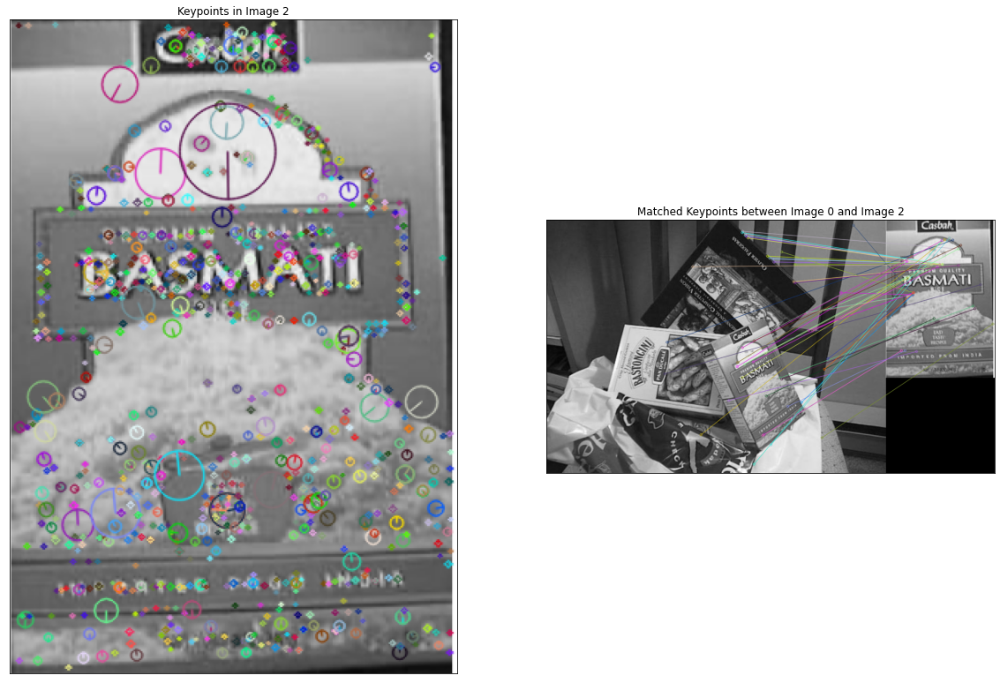

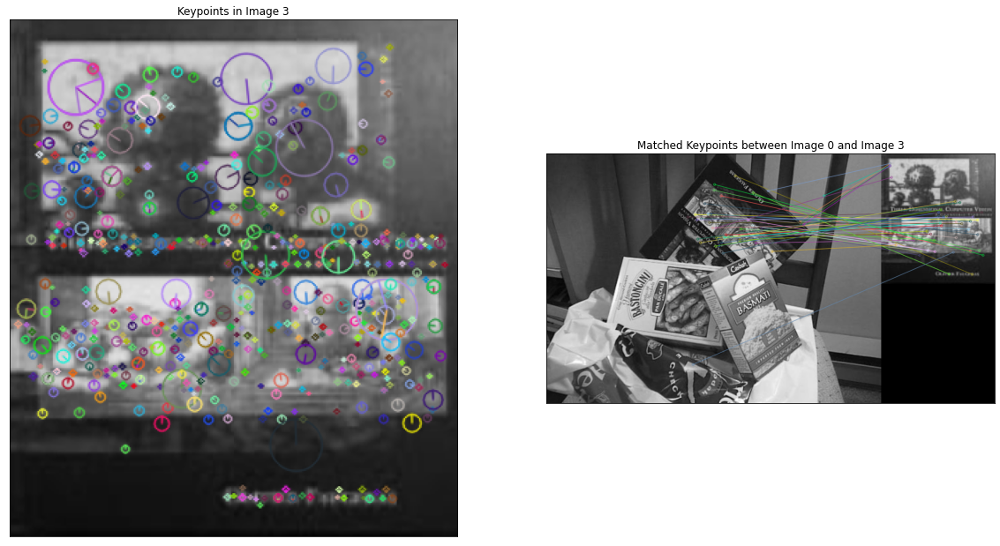

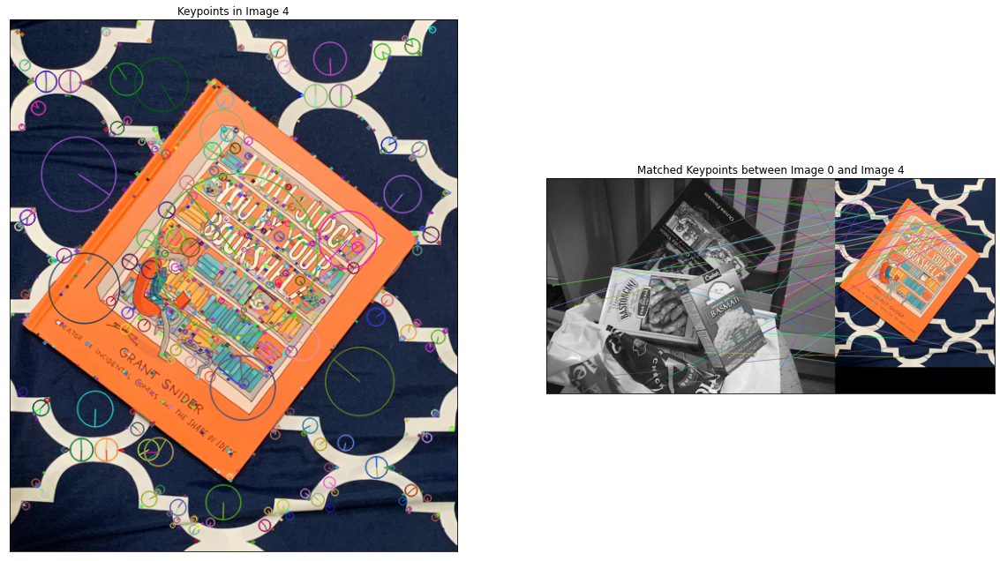

In [74]:
# Call the compute_keypoints_and_descriptors() function to find the SIFT  keypoints
# I added the book_image in order to compare with an image that is not part of the reference image
images = [q4_image, q4_1_image, q4_2_image, q4_3_image, book_image]
keypoints_array, descriptors_array, images_copy, matches = [], [], [], []

for i in range(len(images)):
  keypoints, descriptors, image_copy = compute_keypoints_and_descriptors(images[i])
  keypoints_array.append(keypoints)
  descriptors_array.append(descriptors)
  images_copy.append(image_copy)

  # Call the matching_keypoints() function to find the matching keypoints between the original image (q4_image) and the 4 others
  # I picked 50 best pairs to see the difference
  if (i == 0):
    plot.figure(figsize = (20, 20))

    plot.imshow(images_copy[i])
    plot.title("Keypoints in Image {}" .format(i, len(matches)))
    plot.xticks([])
    plot.yticks([])

  else:
    matches, output_image = matching_keypoints(images[0], images[i], keypoints_array[0], keypoints_array[i], descriptors_array[0], descriptors_array[i], 50)
  
    plot.figure(figsize = (20, 20))

    plot.subplot(121)
    plot.imshow(images_copy[i])
    plot.title("Keypoints in Image {}" .format(i, len(matches)))
    plot.xticks([])
    plot.yticks([])

    plot.subplot(122)
    plot.imshow(output_image)
    plot.title("Matched Keypoints between Image 0 and Image {}" .format(i))
    plot.xticks([])
    plot.yticks([])

    plot.show() 

As can be seen on the above images, we used a reference image q4_image and we checked if 4 other images were present on the reference image. <br/>
By observing with a naked eye, we can see that the first 3 images are indeed a part of the reference image. However, the 4th image is not. <br/>
In order to observe that using SIFT features, we first drew the SIFT keypoints of each image. Then we checked the matching keypoints between the reference image and all the other ones. <br/>
We can observe that for the 3 black an white books, we have a majority of matching keypoints positioned on a specific part in the reference image, meaning that, indeed the iamge studied match with this specific part of the reference image. For the 4th image, the colored book image, we observe that the matching keypoints are all over the reference image and most of them actually match because of the shape of the book or the light. We can also observe some false positive matching keypoints for all of the images.<br/>
We can conclude that the 3 given black and white images are (not entirely)visible on the reference image while the colored book is not present at all on the reference image.<br/>
<br/>
Using the SSD (Sum of Square Differences) metric between the reference image and the other images would result in a fail since we have black and white images here with total different angles and hidden parts, i.e., occlusion. Indeed, the SSD metric measures the matches between 2 images based on pixel intensity differences.
In our case, the reference image and the other given images are not represented with the same angle and some parts of the books in the reference image are hidden. Therefore, the closes features we see in the reference image can be far on the other image (or vice versa) and the difference between the pixel intensity between the 2 images would not result in 0 all of the time. Therefore a bad match could occur.